In [ ]:
import tensorflow as tf
from tensorflow import keras

In [ ]:
from tensorflow.keras.utils import to_categorical
from keras.applications.vgg19 import VGG19, preprocess_input
from keras.models import Model, Sequential, load_model
from keras import layers, models
from keras.callbacks import EarlyStopping
from keras.layers import Flatten, Dense, GlobalMaxPooling2D
from tensorflow.keras.optimizers import Adam
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from skimage.transform import resize

from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from IPython.display import Image, display
import cv2
tf.random.set_seed(1234)

# Model Loading and Training

Load the dataset

Labels:

cat - 0

dog - 1

horse - 2

elephant - 3


In [ ]:
x_train, x_test = np.load("/content/drive/MyDrive/XAIProject/images_train.npy"), np.load("/content/drive/MyDrive/XAIProject/images_test.npy")
y_train, y_test = np.load("/content/drive/MyDrive/XAIProject/y_train.npy"), np.load("/content/drive/MyDrive/XAIProject/y_test.npy")

In [ ]:
## Transforming labels to correct format
y_train = to_categorical(y_train, num_classes=4)
y_test = to_categorical(y_test, num_classes=4)

In [ ]:
## Loading VGG19 model
def create_model(input_shape, n_classes, fine_tune=0):
    
  base_model = VGG19(weights="imagenet", include_top=False, input_shape=input_shape)
  if fine_tune > 0:
    for layer in base_model.layers[:-fine_tune]:
      layer.trainable = False
  else:
    for layer in base_model.layers:
      layer.trainable = False

  top_model = base_model.output
  top_model = Flatten(name="flatten")(top_model)
  top_model = Dense(4096, activation='relu')(top_model)
  top_model = Dense(1072, activation='relu')(top_model)
  output_layer = Dense(n_classes, activation='softmax')(top_model)
  model = Model(inputs=base_model.inputs, outputs=output_layer)

  return model

In [ ]:
# Shuffle the dataset
x_train, y_train = shuffle(x_train, y_train)
# x_test, y_test = shuffle(x_test, y_test)

In [ ]:
## Preprocessing input
x_train_preprocess = preprocess_input(x_train) 
x_test_preprocess = preprocess_input(x_test)

In [ ]:
BATCH_SIZE = 64

input_shape = (256, 256, 3)
optim_1 = Adam(learning_rate=0.001)

n_classes=4
# n_steps = x_train_preprocess.samples // BATCH_SIZE
# n_epochs = 50

# Re-compile the model, this time leaving the last 2 layers unfrozen for Fine-Tuning
model = create_model(input_shape, n_classes, 2)

80150528/80134624 [==============================] - 1s 0us/step


In [ ]:
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy'],
)


es = EarlyStopping(monitor='val_accuracy', mode='max', patience=5,  restore_best_weights=True)

model.fit(x_train_preprocess, y_train, epochs=50, validation_split=0.2, batch_size=32, callbacks=[es])

Epoch 1/50
122/122 [==============================] - 33s 180ms/step - loss: 6.4460 - accuracy: 0.8221 - val_loss: 0.4500 - val_accuracy: 0.8893
Epoch 2/50
122/122 [==============================] - 19s 159ms/step - loss: 0.2498 - accuracy: 0.9292 - val_loss: 0.6200 - val_accuracy: 0.8986
Epoch 3/50
122/122 [==============================] - 19s 158ms/step - loss: 0.3045 - accuracy: 0.9269 - val_loss: 0.3325 - val_accuracy: 0.9150
Epoch 4/50
122/122 [==============================] - 19s 159ms/step - loss: 0.1843 - accuracy: 0.9546 - val_loss: 0.3677 - val_accuracy: 0.9334
Epoch 5/50
122/122 [==============================] - 19s 157ms/step - loss: 0.1480 - accuracy: 0.9687 - val_loss: 0.3747 - val_accuracy: 0.9221
Epoch 6/50
122/122 [==============================] - 19s 159ms/step - loss: 0.0686 - accuracy: 0.9779 - val_loss: 0.4203 - val_accuracy: 0.9467
Epoch 7/50
122/122 [==============================] - 19s 157ms/step - loss: 0.0900 - accuracy: 0.9800 - val_loss: 0.4778 - val_ac

In [ ]:
# # evaluate model on test dataset
_, acc = model.evaluate(x_test_preprocess, y_test, verbose=0)
print('> %.3f' % (acc * 100.0))

> 94.526


In [ ]:
model.summary()

# XAI Methods - Grad-CAM, Guided Backpropagation and Guided Grad-CAM

In [ ]:
x = x_test_preprocess[1089]
preprocessed_input = np.expand_dims(x, axis=0)
img = x_test[1089]

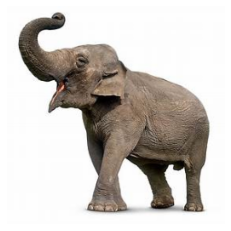

In [ ]:
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [ ]:
layer_name = 'block5_conv4'
'''create a model till  last convolutional layers to have the best compromise between high-level semantics and detailed spatial
information'''
gb_model = tf.keras.models.Model(
    inputs = [model.inputs],    
    outputs = [model.get_layer(layer_name).output]
)
layer_dict = [layer for layer in gb_model.layers[1:] if hasattr(layer,'activation')]
layer_dict

In [ ]:
@tf.custom_gradient
def guidedRelu(x):
  def grad(dy):
    return tf.cast(dy>0,"float32") * tf.cast(x>0, "float32") * dy
  return tf.nn.relu(x), grad

In [ ]:
for layer in layer_dict:
  if layer.activation == tf.keras.activations.relu:
    layer.activation = guidedRelu

In [ ]:
with tf.GradientTape() as tape:
 inputs = tf.cast(preprocessed_input, tf.float32)
 tape.watch(inputs)
 outputs = gb_model(inputs)[0]
grads = tape.gradient(outputs,inputs)[0]

In [ ]:
weights = tf.reduce_mean(grads, axis=(0, 1))
grad_cam = np.ones(outputs.shape[0: 2], dtype = np.float32)
for i, w in enumerate(weights):
    grad_cam += w * outputs[:, :, i]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


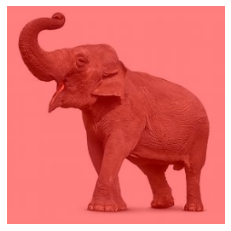

In [ ]:
grad_cam_img = cv2.resize(grad_cam.numpy(), (256, 256))
grad_cam_img = np.maximum(grad_cam_img, 0)
heatmap = (grad_cam_img - grad_cam_img.min()) / (grad_cam_img.max() - grad_cam_img.min())
grad_cam_img = cv2.applyColorMap(np.uint8(255*heatmap), cv2.COLORMAP_JET)
output_image = cv2.addWeighted(cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR), 0.5, grad_cam_img, 1, 0)

plt.imshow(output_image)
plt.axis("off");
plt.show()

# Guided Backprop

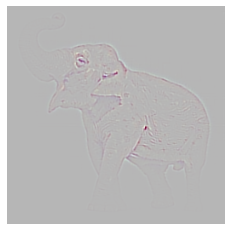

In [ ]:
#Visualizing the guided back prop
guided_back_prop =grads
gb_viz = np.dstack((
            guided_back_prop[:, :, 0],
            guided_back_prop[:, :, 1],
            guided_back_prop[:, :, 2],
        ))       
gb_viz -= np.min(gb_viz)
gb_viz /= gb_viz.max()
    
imgplot = plt.imshow(gb_viz)
plt.axis("off")
plt.show()


# Guided Gradcam

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


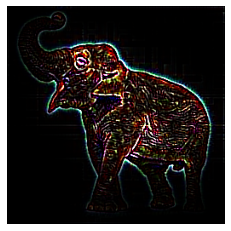

In [ ]:
guided_cam = np.maximum(grad_cam, 0)
guided_cam = guided_cam / np.max(guided_cam) # scale 0 to 1.0
guided_cam = resize(guided_cam, (256,256), preserve_range=True)
#pointwise multiplcation of guided backprop and grad CAM 
gd_gb = np.dstack((
        guided_back_prop[:, :, 0] * guided_cam,
        guided_back_prop[:, :, 1] * guided_cam,
        guided_back_prop[:, :, 2] * guided_cam,
    ))
imgplot = plt.imshow(gd_gb)
plt.axis("off")
plt.show()


# Grad-CAM

In [ ]:
model.layers[-1].activation = None

In [ ]:
test_image = x_test[1089,:,:,:]
array = keras.preprocessing.image.img_to_array(test_image)
array = np.expand_dims(array, axis=0)

In [ ]:
last_conv_layer_name = 'block5_conv4'

In [ ]:
# First, we create a model that maps the input image to the activations
# of the last conv layer as well as the output predictions
grad_model = tf.keras.models.Model(
    [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
)

In [ ]:
# '''create a model till  last convolutional layers to have the best compromise between high-level semantics and detailed spatial
# information'''
# grad_model = tf.keras.models.Model(
#     inputs = [model.inputs],    
#     outputs = [model.get_layer(last_conv_layer_name).output]
# )
# layer_dict = [layer for layer in grad_model.layers[1:] if hasattr(layer,'activation')]

In [ ]:
pred_index = None
with tf.GradientTape() as tape:
  last_conv_layer_output, preds = grad_model(array)
  print(last_conv_layer_output.shape)
  if pred_index is None:
    pred_index = tf.argmax(preds[0])
  class_channel = preds[:, pred_index]

grads = tape.gradient(class_channel, last_conv_layer_output)
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
last_conv_layer_output = last_conv_layer_output[0]
heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
heatmap = tf.squeeze(heatmap)
heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
heatmap=heatmap.numpy()

print(grads.shape, pooled_grads.shape,last_conv_layer_output.shape,heatmap.shape)

(1, 16, 16, 512)
(1, 16, 16, 512) (512,) (16, 16, 512) (16, 16)


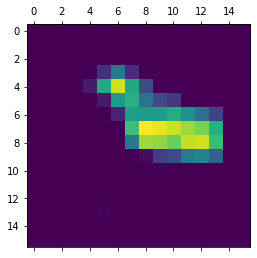

In [ ]:
plt.matshow(heatmap)

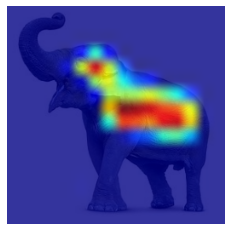

In [ ]:
def save_and_display_gradcam(img, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    # img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * (0.8) + img * (0.2)
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

    # return superimposed_img

    # Save the superimposed image
    # superimposed_img.save(cam_path)

    # Display Grad CAM
    # display(Image(cam_path))


save_and_display_gradcam(test_image, heatmap)

# Layer-wise Attention Maps

In [ ]:
def get_activations_at(model,input_image, i):
  #index the layer 
  out_layer = model.layers[i]
  
  #change the output of the model 
  model = tf.keras.models.Model(inputs = model.inputs, outputs = out_layer.output)
  
  #return the activations
  return model.predict(input_image)

In [ ]:
def postprocess_activations(activations):

  #using the approach in https://arxiv.org/abs/1612.03928
  output = np.abs(activations)
  output = np.sum(output, axis = -1).squeeze()

  #resize and convert to image 
  output = cv2.resize(output, (256, 256))
  # output = output.reshape((256,256,3))
  output /= output.max()
  output *= 255
  return 255 - output.astype('uint8')

In [ ]:
def apply_heatmap(weights, img):
  #generate heat maps 
  heatmap = cv2.applyColorMap(weights, cv2.COLORMAP_JET)
  heatmap = cv2.addWeighted(heatmap, 0.7, img, 0.3, 0)
  return heatmap

In [ ]:
def plot_heatmaps(model,test_image,rng):
  level_maps = None

  # rng = range(7,14)

  #given a range of indices generate the heat maps 
  for i in rng:
    activations = get_activations_at(model,array, i)
    weights = postprocess_activations(activations)
    heatmap_img = cv2.applyColorMap(weights, cv2.COLORMAP_JET)
    fin = cv2.addWeighted(heatmap_img, 0.6, test_image, 0.4, 0)
    
    if level_maps is None:
      level_maps = fin
    else:
      level_maps = np.concatenate([level_maps, fin], axis = 1)
  plt.figure(figsize=(10, 10))
  plt.axis('off')
  ax = plt.imshow(level_maps)
  plt.show()

Test Image 1
Predicted Class Label 0


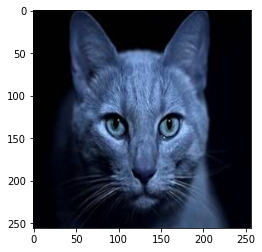

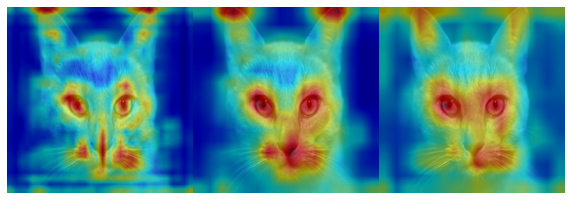


Test Image 2
Predicted Class Label 0


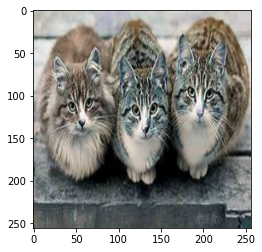

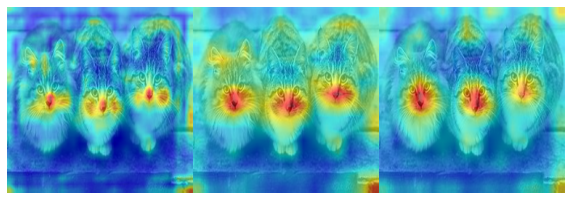


Test Image 3
Predicted Class Label 0


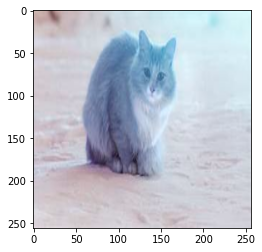

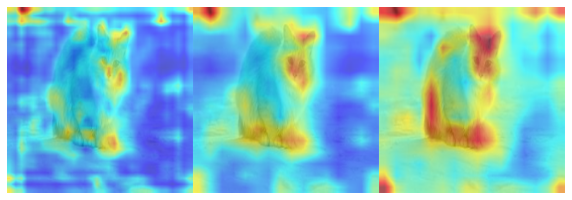


Test Image 4
Predicted Class Label 0


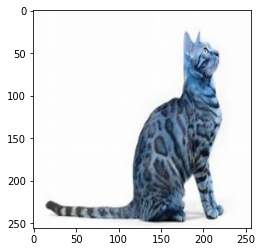

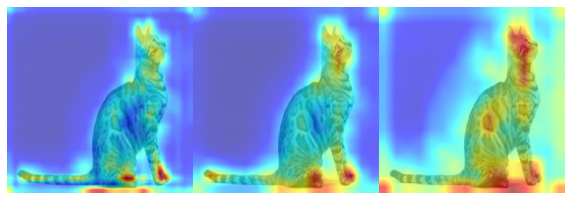


Test Image 5
Predicted Class Label 0


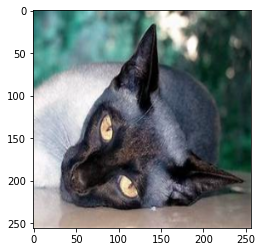

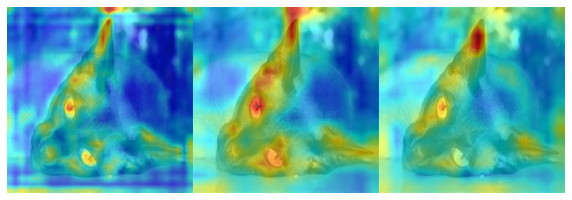


Test Image 6
Predicted Class Label 0


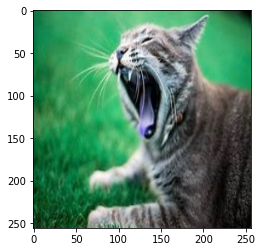

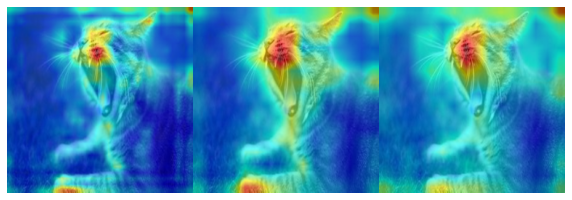


Test Image 7
Predicted Class Label 0


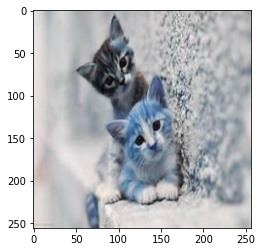

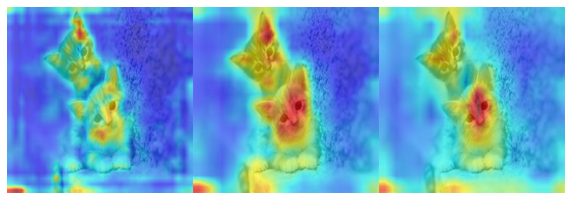


Test Image 8
Predicted Class Label 0


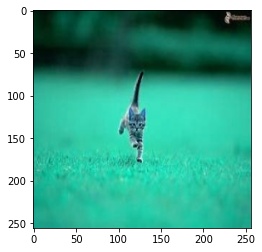

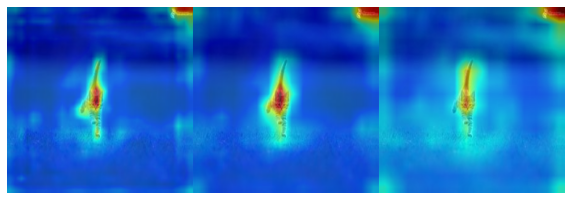


Test Image 9
Predicted Class Label 0


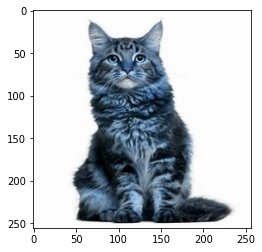

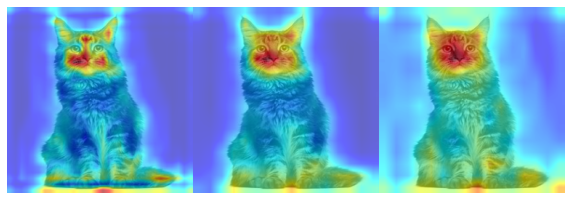


Test Image 10
Predicted Class Label 0


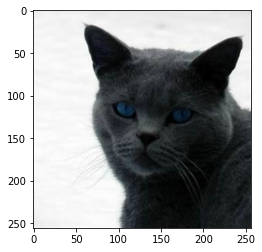

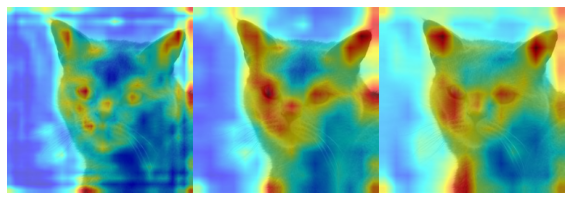

In [ ]:
for i in range(10):
  test_image = x_test_preprocess[0+i,:,:,:]
  array = keras.preprocessing.image.img_to_array(test_image)
  array = np.expand_dims(array, axis=0)
  # plt.figure(figsize=(10, 10))
  print("Test Image",i+1)
  plt.imshow(x_test[0+i])
  print("Predicted Class Label",np.argmax(model.predict(array)))
  plot_heatmaps(model,x_test[0+i],range(15, 18))
  print()

Test Image 1
Predicted Class Label 3


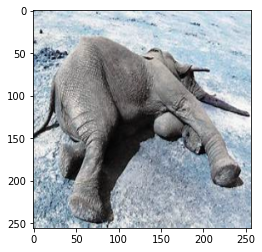

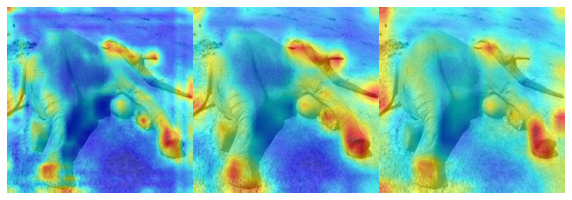


Test Image 2
Predicted Class Label 3


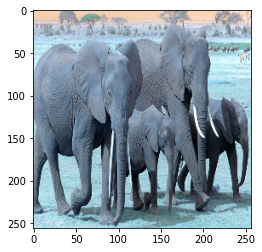

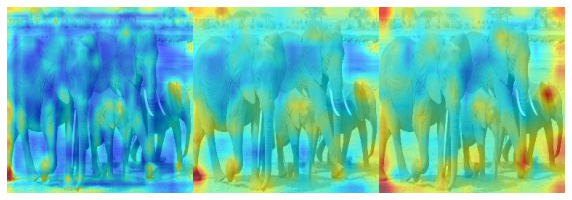


Test Image 3
Predicted Class Label 3


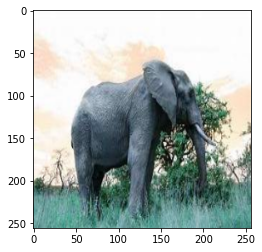

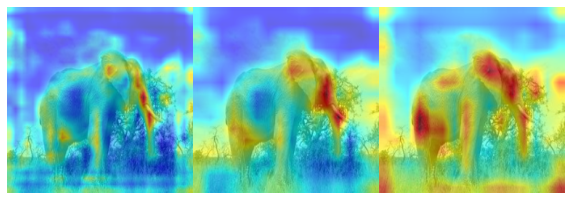


Test Image 4
Predicted Class Label 3


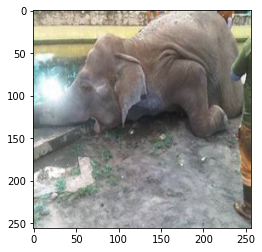

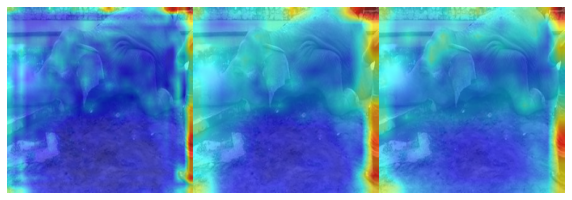


Test Image 5
Predicted Class Label 3


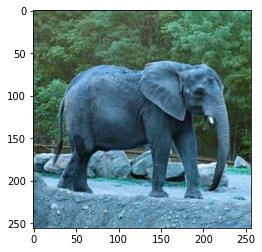

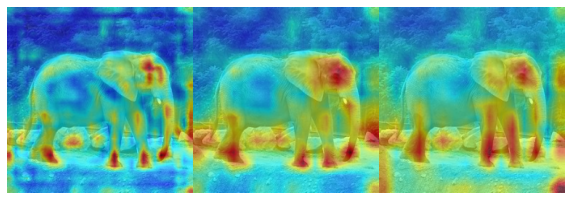


Test Image 6
Predicted Class Label 3


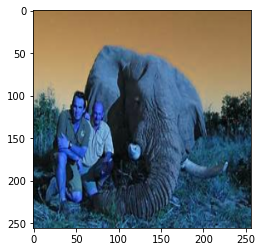

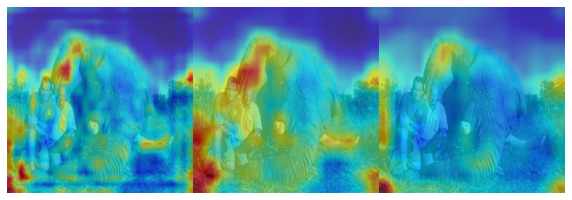


Test Image 7
Predicted Class Label 3


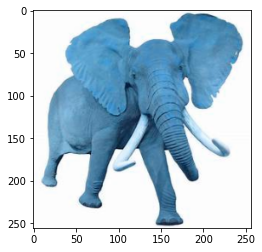

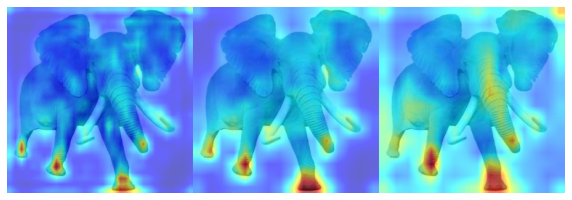


Test Image 8
Predicted Class Label 2


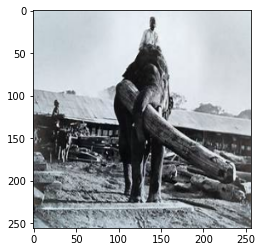

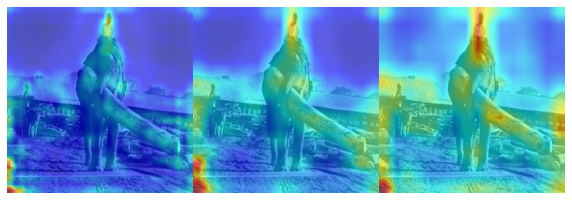


Test Image 9
Predicted Class Label 3


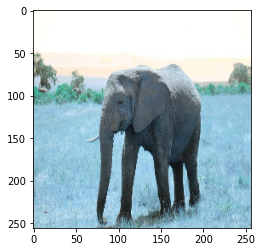

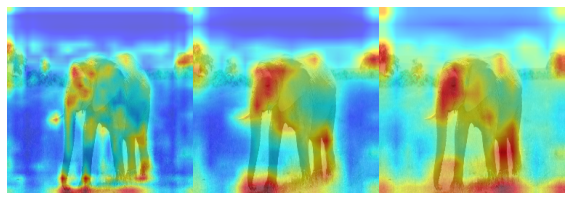


Test Image 10
Predicted Class Label 3


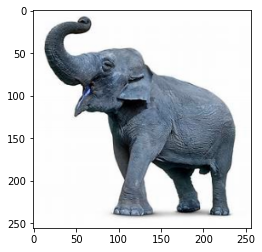

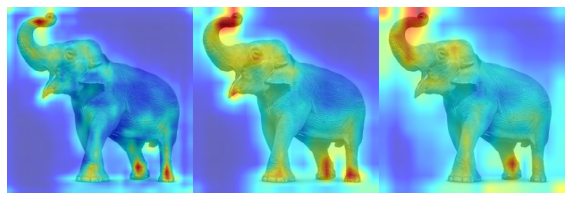

In [ ]:
for i in range(10):
  test_image = x_test_preprocess[1080+i,:,:,:]
  array = keras.preprocessing.image.img_to_array(test_image)
  array = np.expand_dims(array, axis=0)
  # plt.figure(figsize=(10, 10))
  print("Test Image",i+1)
  plt.imshow(x_test[1080+i])
  print("Predicted Class Label",np.argmax(model.predict(array)))
  plot_heatmaps(model,x_test[1080+i],range(15, 18))
  print()

Test Image 1
Predicted Class Label 2


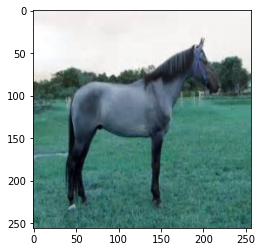

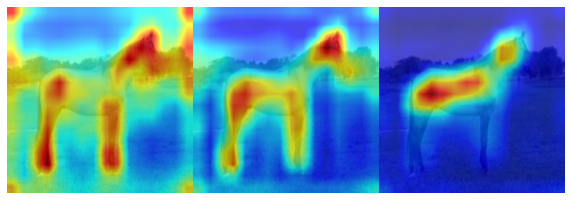


Test Image 2
Predicted Class Label 2


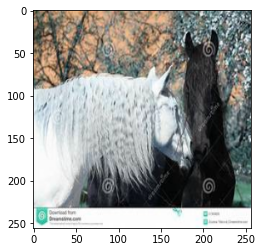

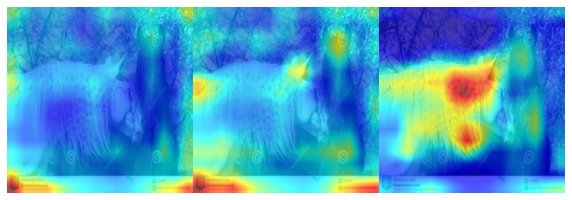


Test Image 3
Predicted Class Label 2


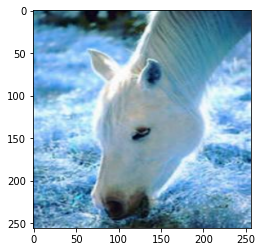

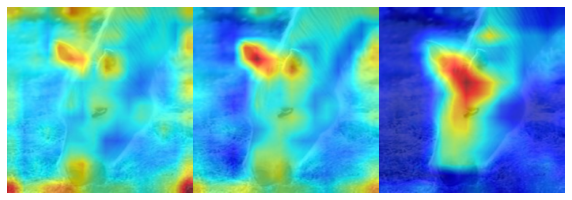


Test Image 4
Predicted Class Label 2


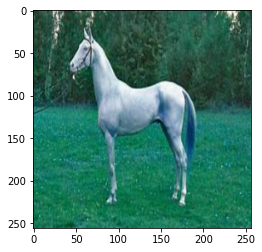

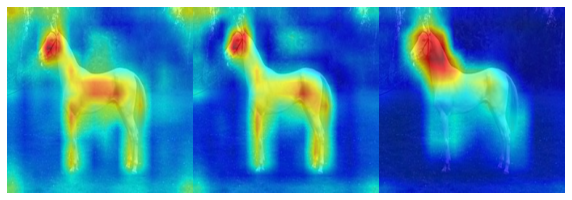


Test Image 5
Predicted Class Label 2


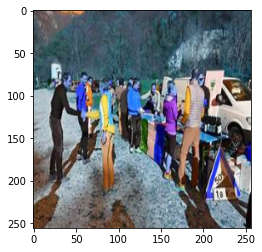

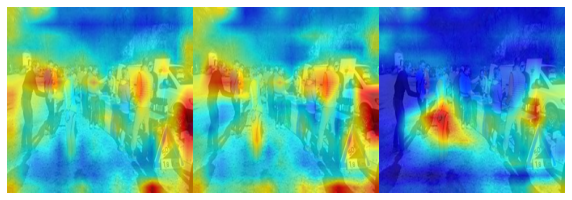


Test Image 6
Predicted Class Label 2


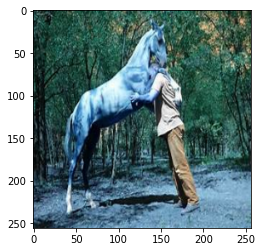

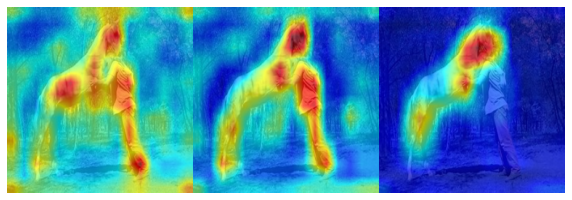


Test Image 7
Predicted Class Label 2


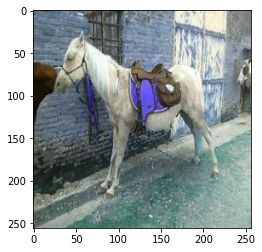

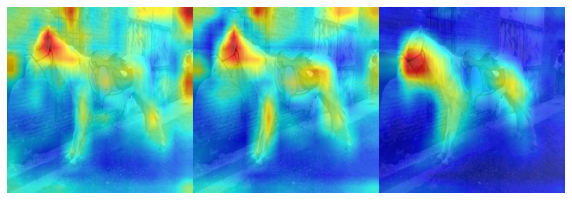


Test Image 8
Predicted Class Label 2


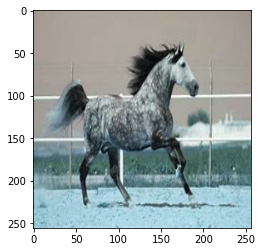

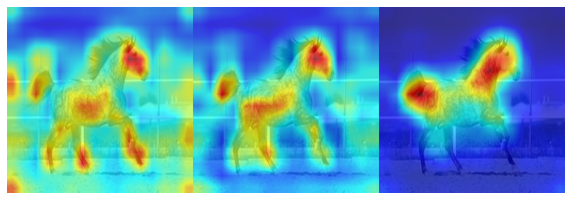


Test Image 9
Predicted Class Label 2


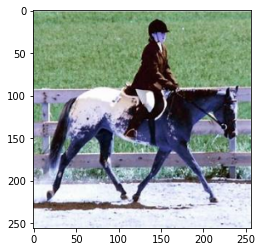

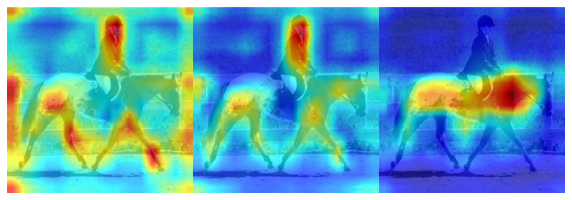


Test Image 10
Predicted Class Label 2


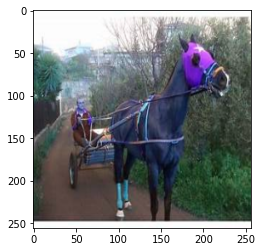

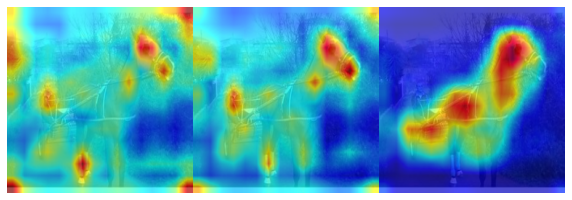

In [ ]:
# for i in range(10):
#   test_image = x_test[720+i,:,:,:]
#   array = keras.preprocessing.image.img_to_array(test_image)
#   array = np.expand_dims(array, axis=0)
#   # plt.figure(figsize=(10, 10))
#   print("Test Image",i+1)
#   plt.imshow(test_image)
#   print("Predicted Class Label",np.argmax(model.predict(array)))
#   plot_heatmaps(model,test_image,range(15, 18))
#   print()

Test Image 1
Predicted Class Label 3


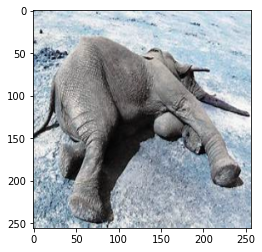

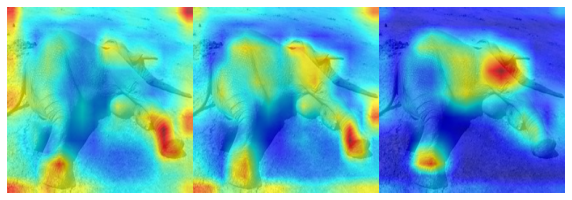


Test Image 2
Predicted Class Label 3


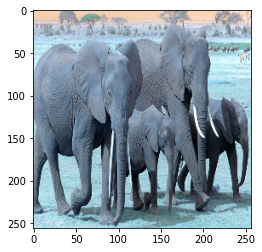

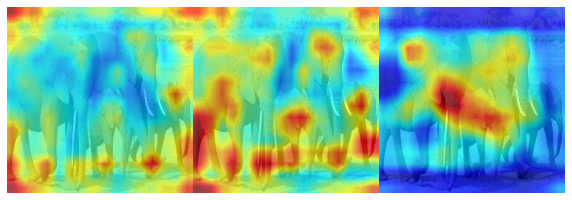


Test Image 3
Predicted Class Label 3


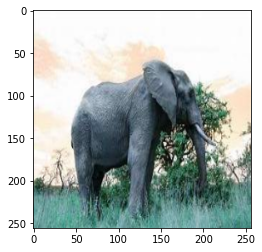

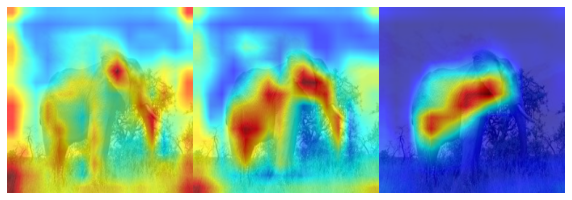


Test Image 4
Predicted Class Label 3


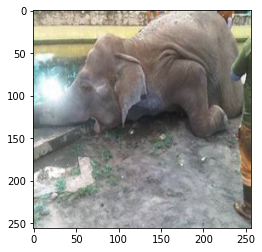

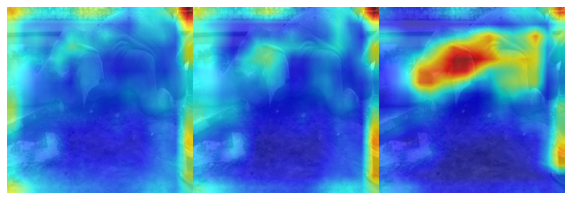


Test Image 5
Predicted Class Label 3


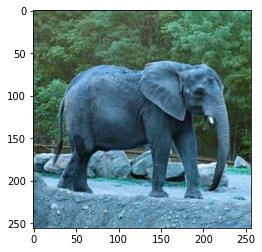

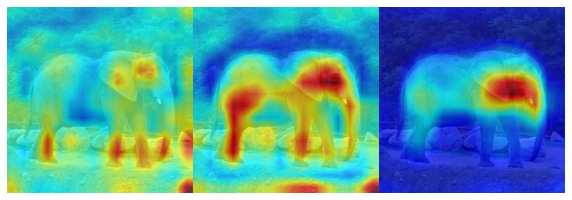


Test Image 6
Predicted Class Label 3


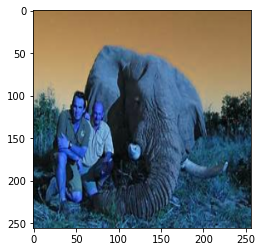

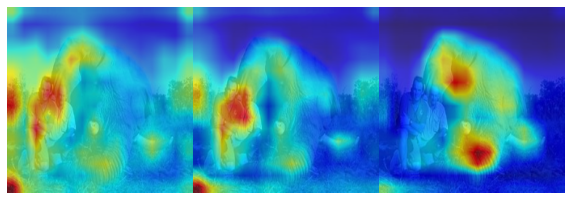


Test Image 7
Predicted Class Label 3


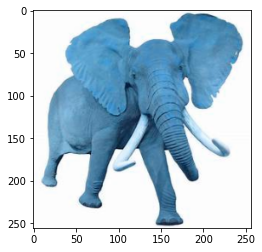

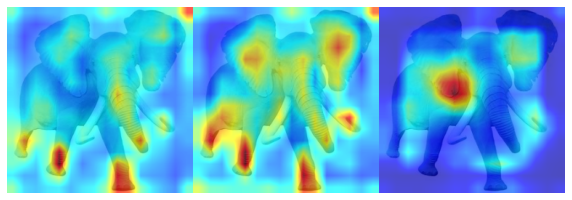


Test Image 8
Predicted Class Label 2


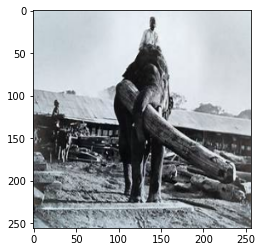

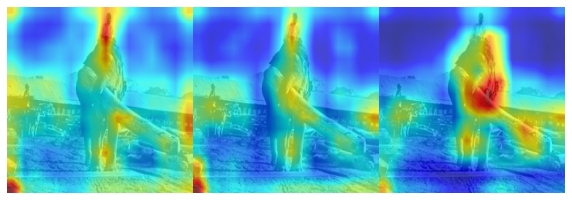


Test Image 9
Predicted Class Label 3


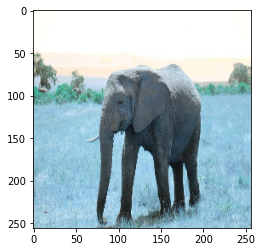

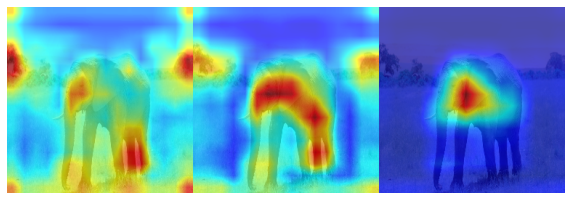


Test Image 10
Predicted Class Label 3


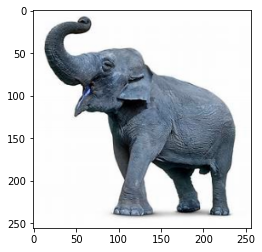

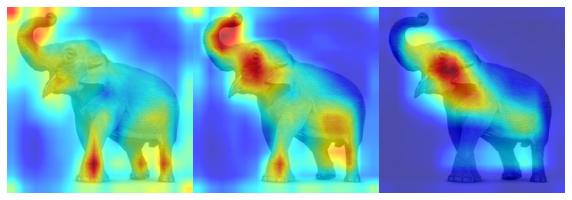

In [ ]:
# for i in range(10):
#   test_image = x_test[1080+i,:,:,:]
#   array = keras.preprocessing.image.img_to_array(test_image)
#   array = np.expand_dims(array, axis=0)
#   # plt.figure(figsize=(10, 10))
#   print("Test Image",i+1)
#   plt.imshow(test_image)
#   print("Predicted Class Label",np.argmax(model.predict(array)))
#   plot_heatmaps(model,test_image,range(15, 18))
#   print()

### Observing GRAD CAM, GUIDED BACK PROP and GUIDED GRAD CAM on test data

In [ ]:
# labels = ['cat','dog','horse','elephant']

In [ ]:
# def analyze_results(test_image):

#   print("Original test image")
#   plt.imshow(x_test[365])
#   plt.show()
#   print("Model Prediction: ",labels[np.argmax(model.predict(test_image))])
#   gradcam(test_image,x_test[365])
#   # guided_back_prop,gb_viz = guided_backprop(grads)
#   # gd_gb = guided_grad_cam(grad_cam,guided_back_prop)
#   # print("Results of GRAD CAM, GUIDED BACK PROP and GUIDED GRAD CAM")
#   # concat_image = np.concatenate([output_image,gb_viz,gd_gb],axis=1)
#   # concat_image = (concat_image * 255).astype(np.uint8)
#   # plt.figure(figsize=(15, 15))
#   # plt.imshow(concat_image)
#   # plt.show()

Original test image


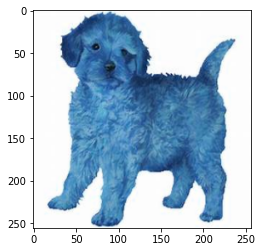

Model Prediction:  dog


TypeError: ignored

In [ ]:
# test_image = x_test_preprocess[365,:,:,:]
# test_image = np.expand_dims(test_image,axis=0)
# analyze_results(test_image)

# Other Code

### Grad Cam

In [ ]:
# #Visualizing the guided back prop
# def guided_backprop(grads):
#   guided_back_prop =grads
#   gb_viz = np.dstack((
#               guided_back_prop[:, :, 0],
#               guided_back_prop[:, :, 1],
#               guided_back_prop[:, :, 2],
#           ))       
#   gb_viz -= np.min(gb_viz)
#   gb_viz /= gb_viz.max()
      
#   imgplot = plt.imshow(gb_viz)
#   plt.axis("off")
#   plt.show()

#   return guided_back_prop, gb_viz

### Guided Gradient Class Activation Map(Guided Grad CAM)

In [ ]:
# def guided_grad_cam(grad_cam,guided_back_prop):
#   guided_cam = np.maximum(grad_cam, 0)
#   guided_cam = guided_cam / np.max(guided_cam) # scale 0 to 1.0
#   guided_cam = resize(guided_cam, (256,256), preserve_range=True)
#   #pointwise multiplcation of guided backprop and grad CAM 
#   gd_gb = np.dstack((
#           guided_back_prop[:, :, 0] * guided_cam,
#           guided_back_prop[:, :, 1] * guided_cam,
#           guided_back_prop[:, :, 2] * guided_cam,
#       ))
#   imgplot = plt.imshow(gd_gb)
#   plt.axis("off")
#   plt.show()

#   return gd_gb

In [ ]:
# (x_train, y_train), (x_test, y_test) = cifar10.load_data()
# assert x_train.shape == (50000, 32, 32, 3)
# assert x_test.shape == (10000, 32, 32, 3)
# assert y_train.shape == (50000, 1)
# assert y_test.shape == (10000, 1)

Considering a subset of CIFAR-10 for classification: dogs, cats, horses, birds

bird - 2
cat - 3
dog - 5
horse - 7

In [ ]:
# indices1 = np.where(y_train[:,0]==2)[0]
# indices2 = np.where(y_train[:,0]==3)[0]
# indices3 = np.where(y_train[:,0]==5)[0]
# indices4 = np.where(y_train[:,0]==7)[0]
# indices = np.concatenate((indices1,indices2,indices3,indices4),axis=None)
# x_train_subset = x_train[indices,:,:,:]
# y_train_subset = np.array([[0 for i in range(5000)]+[1 for i in range(5000)]+[2 for i in range(5000)]+[3 for i in range(5000)]]).T

In [ ]:
# y_train_subset.shape, x_train_subset.shape

In [ ]:
# indices1 = np.where(y_test[:,0]==2)[0]
# indices2 = np.where(y_test[:,0]==3)[0]
# indices3 = np.where(y_test[:,0]==5)[0]
# indices4 = np.where(y_test[:,0]==7)[0]
# indices = np.concatenate((indices1,indices2,indices3,indices4),axis=None)
# x_test_subset = x_test[indices,:,:,:]
# y_test_subset = np.array([[0 for i in range(1000)]+[1 for i in range(1000)]+[2 for i in range(1000)]+[3 for i in range(1000)]]).T

In [ ]:
# y_test_subset.shape, x_test_subset.shape

In [ ]:
# x_train_subset, y_train_subset = shuffle(x_train_subset, y_train_subset)
# x_test_subset, y_test_subset = shuffle(x_test_subset, y_test_subset)

In [ ]:
# x_train_subset = x_train_subset.astype('float32')
# x_test_subset = x_test_subset.astype('float32')
# x_train_subset  /= 255
# x_test_subset /= 255

In [ ]:
# y_train_subset = np_utils.to_categorical(y_train_subset[:,0], nb_classes)
# y_test_subset = np_utils.to_categorical(y_test_subset[:,0], nb_classes)

In [ ]:
# x_train_subset, x_val_subset, y_train_subset, y_val_subset = train_test_split(x_train_subset, y_train_subset, test_size=0.2, random_state=42)

In [ ]:
# # augment images with a generator
# cifar_gen = ImageDataGenerator(
#     rotation_range=15,
#     width_shift_range=0.1,
#     height_shift_range=0.1,
#     horizontal_flip=True,
#     )
# cifar_gen.fit(x_train_subset)

In [ ]:
# # create convolutional neural network (CNN)
# def create_cnn(input_shape=x_train.shape[1:], nb_classes=nb_classes, 
#                nb_blocks=3, nb_filters=32, filter_size=(3,3), 
#                pool_size=(2,2), weight_decay=1e-4, padding='same', 
#                dropout=.2, output_activation='softmax'):

#     model = Sequential()

#     for i in range(nb_blocks):
#         if i==0:
#             model.add(Conv2D(nb_filters, filter_size, activation='relu', 
#                              padding=padding, kernel_regularizer=regularizers.l2(weight_decay), 
#                              input_shape=input_shape))
#         else:
#             model.add(Conv2D(nb_filters, filter_size, activation='relu', 
#                              padding=padding, kernel_regularizer=regularizers.l2(weight_decay)))        
#         model.add(BatchNormalization())
#         model.add(Conv2D(nb_filters, filter_size, activation='relu', 
#                   padding=padding, kernel_regularizer=regularizers.l2(weight_decay)))
#         model.add(BatchNormalization())
#         model.add(MaxPooling2D(pool_size=pool_size))
#         model.add(Dropout(dropout))

#     model.add(Flatten())
#     model.add(Dense(nb_classes, activation=output_activation))

#     return model

In [ ]:
# cnn = create_cnn(nb_filters=32)

# # compile CNN
# # opt_rms = RMSprop(learning_rate=0.001, decay=1e-6)
# cnn.compile(loss='categorical_crossentropy', optimizer=Adam(), metrics=['accuracy'])

# # train CNN
# batch_size = 128
# epochs = 100

# cnn_history = cnn.fit(cifar_gen.flow(x_train_subset, y_train_subset, batch_size=batch_size),
#                                   epochs=epochs,
#                                   verbose=1,
#                                   validation_data=(x_val_subset,y_val_subset))

In [ ]:
# # evaluate model on test dataset
# _, acc = cnn.evaluate(x_test_subset, y_test_subset, verbose=0)
# print('> %.3f' % (acc * 100.0))

In [ ]:
# #preprocess image to get it into the right format for the model
# _img = x_test_subset[0,:,:,:]
# img = keras.preprocessing.image.img_to_array(_img)
# img = img.reshape((1, *img.shape))
# y_pred = cnn.predict(img)

In [ ]:
# y_pred

In [ ]:
# plt.imshow(_img)

In [ ]:
# images = tf.Variable(img, dtype=float)

# with tf.GradientTape() as tape:
#     pred = cnn(images, training=False)
#     class_idxs_sorted = np.argsort(pred.numpy().flatten())[::-1]
#     loss = pred[0][class_idxs_sorted[0]]
    
# grads = tape.gradient(loss, images)

In [ ]:
# grads

In [ ]:
# dgrad_abs = tf.math.abs(grads)

In [ ]:
# dgrad_max_ = np.max(dgrad_abs, axis=3)[0]

In [ ]:
# ## normalize to range between 0 and 1
# arr_min, arr_max  = np.min(dgrad_max_), np.max(dgrad_max_)
# grad_eval = (dgrad_max_ - arr_min) / (arr_max - arr_min + 1e-18)

In [ ]:
# fig, axes = plt.subplots(1,2,figsize=(14,5))

# axes[0].imshow(_img)
# i = axes[1].imshow(grad_eval,cmap="jet",alpha=0.8)
# fig.colorbar(i)

# Code Sources:

CNN, Transfer Learning with VGG-16 and ResNet-50, Feature Extraction for Image Retrieval with Keras
https://medium.com/analytics-vidhya/cnn-transfer-learning-with-vgg-16-and-resnet-50-feature-extraction-for-image-retrieval-with-keras-53320c580853

How to Visually Explain any CNN based Models
https://towardsdatascience.com/how-to-visually-explain-any-cnn-based-models-80e0975ce57

Attention Maps https://colab.research.google.com/github/zaidalyafeai/AttentioNN/blob/master/Attention_Maps.ipynb

